In [3]:


import os
import pandas as pd

# Step 1: Load the dataset
dataset_path = "/kaggle/input/2class-list/2class_list.csv" 
images_folder = "/kaggle/input/elliptial-galaxy/DATA"  

# Read the CSV file
df = pd.read_csv(dataset_path)

# Display first few rows of the dataset
print(df.head())

# Verify and map real image file names
def map_image_names(df, images_folder):
    real_image_names = []
    for cataid in df["CATAID"]:
        image_name = f"{cataid}_giH.png"
        image_path = os.path.join(images_folder, image_name)
        if os.path.exists(image_path):
            real_image_names.append(image_name)
        else:
            real_image_names.append(None)  # Mark missing images as None
    return real_image_names

# Map real image names
df["real_image_name"] = map_image_names(df, images_folder)

# Check for missing images
missing_images = df[df["real_image_name"].isnull()]
if not missing_images.empty:
    print(f"Missing images: {len(missing_images)}")
    print(missing_images)
else:
    print("All images were successfully mapped.")


# Display the updated dataframe
print(df.head())

df.to_csv("/kaggle/working/mapped_dataset.csv", index=False)

   CATAID  TARGET
0  287931       0
1  229164       0
2  509553       1
3  623594       1
4  123687       1
All images were successfully mapped.
   CATAID  TARGET real_image_name
0  287931       0  287931_giH.png
1  229164       0  229164_giH.png
2  509553       1  509553_giH.png
3  623594       1  623594_giH.png
4  123687       1  123687_giH.png


In [3]:
import os
import numpy as np
import pandas as pd
from tensorflow.keras.utils import load_img, img_to_array
from sklearn.model_selection import train_test_split

dataset_path = "/kaggle/working/mapped_dataset.csv" 
# Load the mapped dataset
df = pd.read_csv(dataset_path)

# Step 1: Load and preprocess images
def load_and_preprocess_images(image_paths):
    images = []
    for path in image_paths:
        if pd.notna(path):  # Ensure the path is not NaN
            full_path = os.path.join(images_folder, path)
            img = load_img(full_path, target_size=(300, 300))  # Load the image
            img_array = img_to_array(img)  # Convert to numpy array
            img_array = img_array / 255.0  # Normalize pixel values to [0, 1]
            images.append(img_array)
        else:
            images.append(None)  # Handle missing paths (if any)
    return np.array([img for img in images if img is not None])  # Exclude None values

# Prepare image paths and labels
image_paths = df["real_image_name"]
labels = df["TARGET"].values  # TARGET should be 0 or 1

# Load the images
X = load_and_preprocess_images(image_paths)
y = np.array(labels, dtype=np.float32)

# Step 2: Split the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(f"Training set size: {X_train.shape}, Test set size: {X_test.shape}")
print(f"Example image shape: {X_train[0].shape}")



Training set size: (4720, 300, 300, 3), Test set size: (1180, 300, 300, 3)
Example image shape: (300, 300, 3)


In [4]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, Flatten, Dropout, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Step 1: Load the pretrained model (ResNet50 in this case)
base_model = ResNet50(weights="imagenet", include_top=False, input_shape=(300, 300, 3))

# Freeze the base model layers to retain pretrained weights
base_model.trainable = False

# Step 2: Add custom layers for binary classification
x = base_model.output
x = GlobalAveragePooling2D()(x)  # Global Average Pooling
x = Dense(128, activation="relu")(x)  # Fully connected layer
x = Dropout(0.5)(x)  # Dropout to prevent overfitting
predictions = Dense(1, activation="sigmoid")(x)  # Sigmoid for binary classification

# Combine the base model and custom layers
model = Model(inputs=base_model.input, outputs=predictions)

# Step 3: Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), 
              loss="binary_crossentropy", 
              metrics=["accuracy"])





94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [5]:
# Step 4: Prepare data augmentation for training
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    fill_mode="nearest"
)

# Fit the ImageDataGenerator on the training data
datagen.fit(X_train)


In [6]:
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

# Calculate class weights
class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weights_dict = {i: class_weights[i] for i in range(len(class_weights))}

# Train the model with class weights
history = model.fit(
    X_train, y_train,
    validation_split=0.2,
    epochs=20,
    batch_size=32,
    class_weight=class_weights_dict,  # Add class weights
    verbose=1
)


Epoch 1/20
118/118 ━━━━━━━━━━━━━━━━━━━━ 33s 178ms/step - accuracy: 0.4814 - loss: 0.7933 - val_accuracy: 0.5159 - val_loss: 0.6927
Epoch 2/20
118/118 ━━━━━━━━━━━━━━━━━━━━ 13s 106ms/step - accuracy: 0.5149 - loss: 0.6938 - val_accuracy: 0.5159 - val_loss: 0.6931
Epoch 3/20
118/118 ━━━━━━━━━━━━━━━━━━━━ 12s 106ms/step - accuracy: 0.5097 - loss: 0.6932 - val_accuracy: 0.5159 - val_loss: 0.6931
Epoch 4/20
118/118 ━━━━━━━━━━━━━━━━━━━━ 12s 106ms/step - accuracy: 0.4934 - loss: 0.6933 - val_accuracy: 0.4841 - val_loss: 0.6932
Epoch 5/20
118/118 ━━━━━━━━━━━━━━━━━━━━ 13s 106ms/step - accuracy: 0.5055 - loss: 0.6936 - val_accuracy: 0.4841 - val_loss: 0.6932
Epoch 6/20
118/118 ━━━━━━━━━━━━━━━━━━━━ 13s 106ms/step - accuracy: 0.4875 - loss: 0.6933 - val_accuracy: 0.4841 - val_loss: 0.6932
Epoch 7/20
118/118 ━━━━━━━━━━━━━━━━━━━━ 12s 105ms/step - accuracy: 0.4813 - loss: 0.6932 - val_accuracy: 0.4841 - val_loss: 0.6932
Epoch 8/20
118/118 ━━━━━━━━━━━━━━━━━━━━ 12s 105ms/step - accuracy: 0.5017 - loss: 0

In [7]:
# Step 6: Evaluate the model
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=1)
print(f"Test Accuracy: {test_accuracy:.2f}")


37/37 ━━━━━━━━━━━━━━━━━━━━ 6s 169ms/step - accuracy: 0.4802 - loss: 0.6932
Test Accuracy: 0.49


37/37 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step

Classification Report:
              precision    recall  f1-score   support

         0.0       0.49      1.00      0.66       584
         1.0       0.00      0.00      0.00       596

    accuracy                           0.49      1180
   macro avg       0.25      0.50      0.33      1180
weighted avg       0.24      0.49      0.33      1180



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


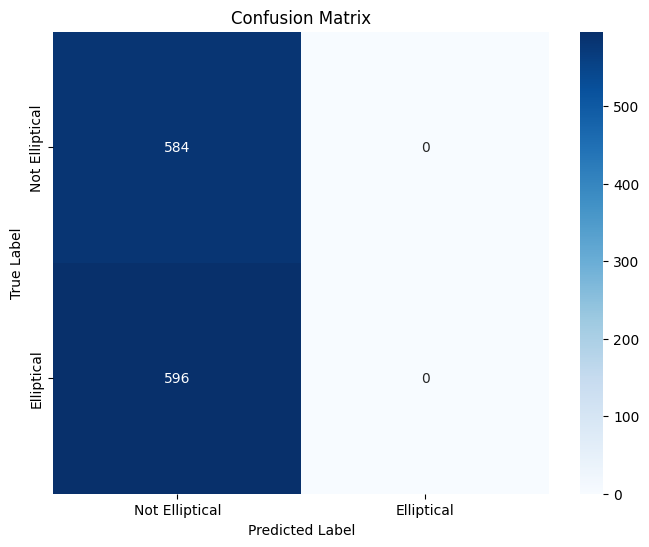

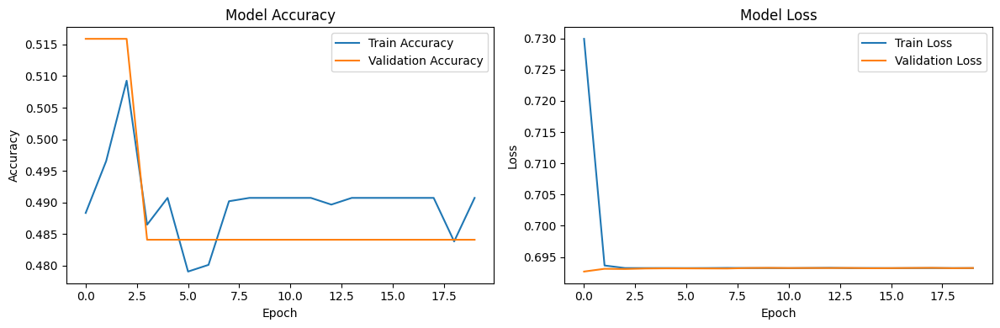

In [8]:
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

y_pred = model.predict(X_test)
y_pred_classes = (y_pred > 0.5).astype("int32")  # Convert probabilities to class labels

# Step 6: Generate and display a classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred_classes))

# Step 7: Plot confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=["Not Elliptical", "Elliptical"], yticklabels=["Not Elliptical", "Elliptical"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

# Step 8: Plot training history
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 636ms/step


<ipython-input-10-02270190aea2>:35: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  plt.imshow(display_grid, aspect='auto', cmap='viridis')
<ipython-input-10-02270190aea2>:26: RuntimeWarning: invalid value encountered in divide
  channel_image /= channel_image.std()
<ipython-input-10-02270190aea2>:29: RuntimeWarning: invalid value encountered in cast
  channel_image = np.clip(channel_image, 0, 255).astype('uint8')
/usr/local/lib/python3.10/dist-packages/matplotlib/_tight_bbox.py:64: RuntimeWarning: divide by zero encountered in scalar divide
  fig.patch.set_bounds(x0 / w1, y0 / h1,
/usr/local/lib/python3.10/dist-packages/matplotlib/_tight_bbox.py:65: RuntimeWarning: divide by zero encountered in scalar divide
  fig.bbox.width / w1, fig.bbox.height / h1)
/usr/local/lib/python3.10/dist-packages/matplotlib/patches.py:739: RuntimeWarning: invalid value encountered in scalar add
  y1 = self.convert_yunits(self._y0 + self.

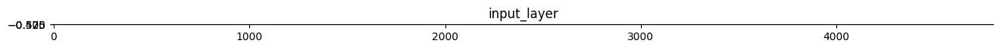

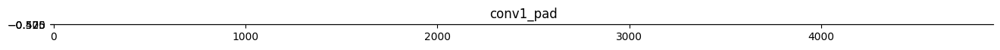

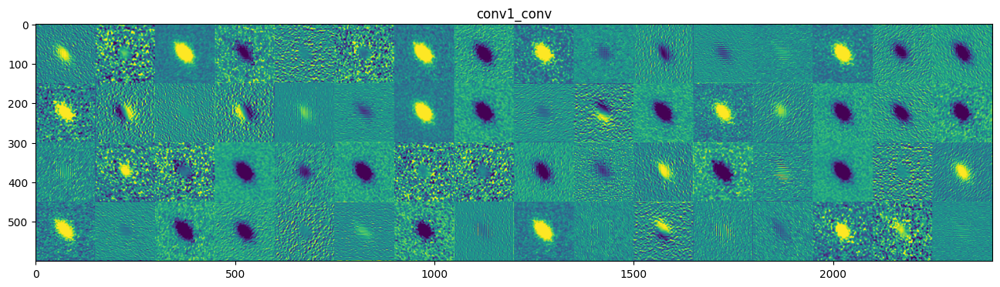

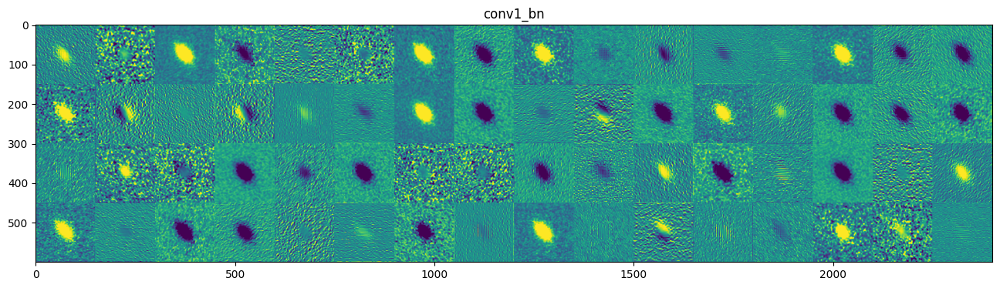

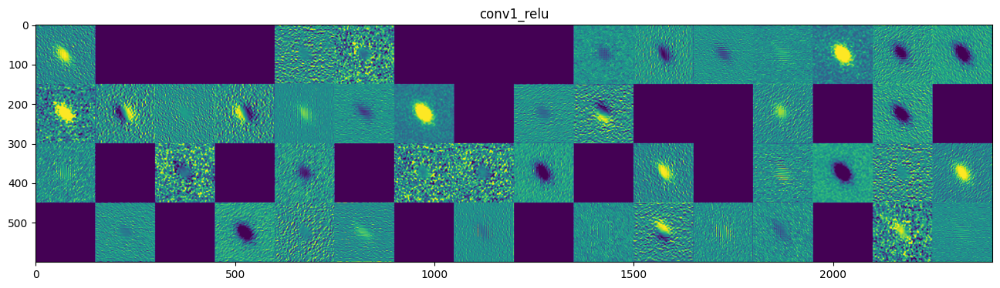

...

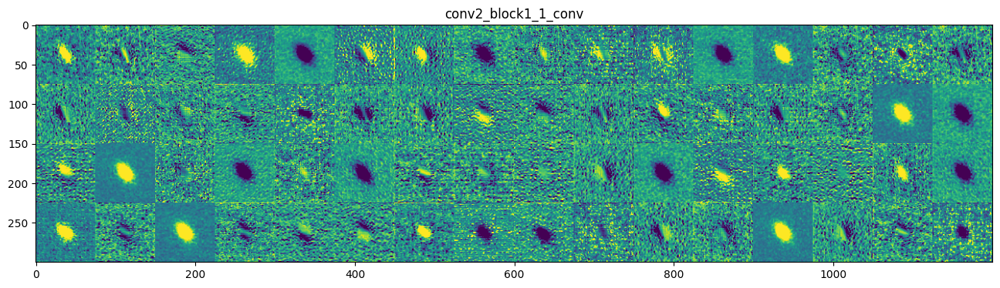

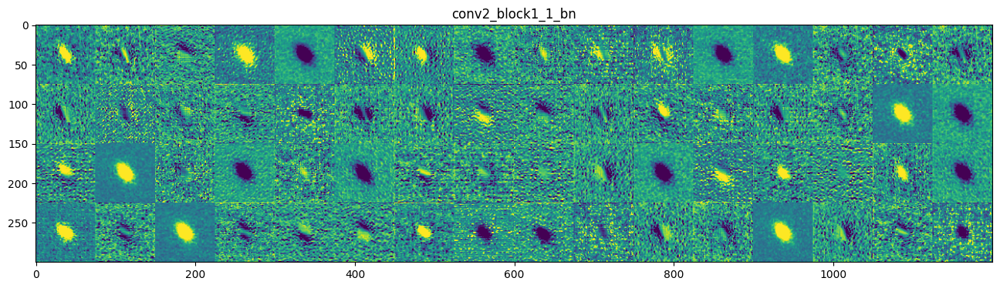

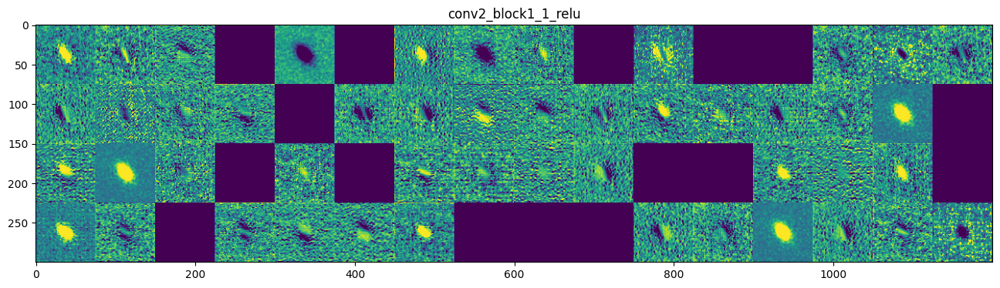

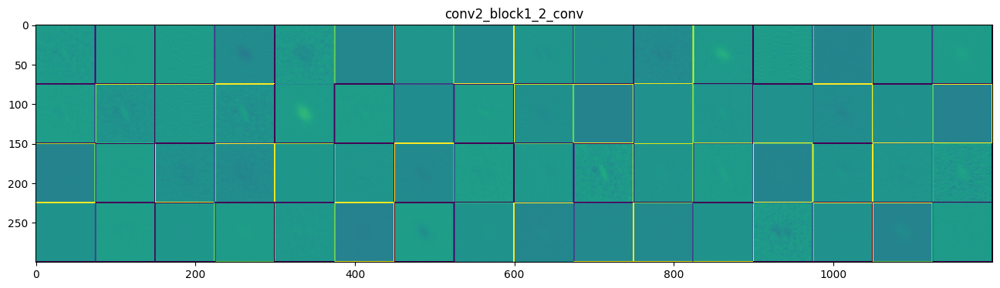

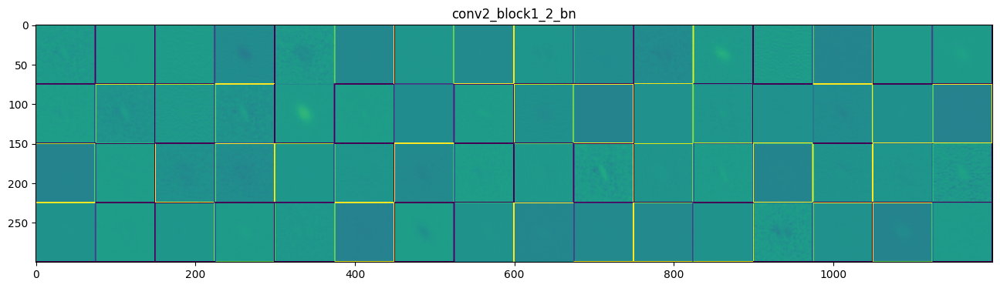

In [10]:
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model



# Function to visualize activations
def visualize_activations(model, img):
    layer_outputs = [layer.output for layer in model.layers[:12]]  # Take first 12 layers
    activation_model = Model(inputs=model.input, outputs=layer_outputs)
    activations = activation_model.predict(img)

    layer_names = []
    for layer in model.layers[:12]:
        layer_names.append(layer.name)

    images_per_row = 16
    for layer_name, layer_activation in zip(layer_names, activations):
        n_features = layer_activation.shape[-1]  # Number of features in the feature map
        size = layer_activation.shape[1]  # Feature map size
        n_cols = n_features // images_per_row  # Tiles the activation channels in this matrix
        display_grid = np.zeros((size * n_cols, images_per_row * size))
        for col in range(n_cols):
            for row in range(images_per_row):
                channel_image = layer_activation[0, :, :, col * images_per_row + row]
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
                channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                display_grid[col * size : (col + 1) * size, row * size : (row + 1) * size] = channel_image
        scale = 1. / size
        plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
        plt.title(layer_name)
        plt.grid(False)
        plt.imshow(display_grid, aspect='auto', cmap='viridis')

# Visualize the activations of a sample image
visualize_activations(model, np.expand_dims(X[0], axis=0))


In [2]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint
from sklearn.utils import class_weight

In [3]:
# Load the CSV file
df = pd.read_csv('/kaggle/input/2class-list/2class_list.csv')

# Separate data for each class
elliptical_df = df[df['TARGET'] == 0]
other_df = df[df['TARGET'] == 1]

# Combine and shuffle
combined_df = pd.concat([elliptical_df, other_df]).sample(frac=1).reset_index(drop=True)

# Convert CATAID to strings
combined_df['CATAID'] = combined_df['CATAID'].astype(str)

# Get image names and labels
image_names = combined_df['CATAID'].tolist()
labels = combined_df['TARGET'].tolist()

# Define paths
image_dir = '/kaggle/input/elliptial-galaxy/DATA'  # Replace with the directory containing your images

# Load images into a NumPy array
def load_images(image_names, image_dir):
    images = []
    for name in image_names:
        img_path = os.path.join(image_dir, name + '_giH.png')
        img = tf.keras.preprocessing.image.load_img(img_path, target_size=(300, 300))
        img_array = tf.keras.preprocessing.image.img_to_array(img)
        images.append(img_array)
    return np.array(images)

# Load images
#images = load_images(image_names, image_dir)
#labels = np.array(labels)


In [4]:

# Split the data into training and validation sets
split_index = int(0.8 * len(images))
train_images, val_images = images[:split_index], images[split_index:]
train_labels, val_labels = labels[:split_index], labels[split_index:]

# Calculate class weights
class_weights = class_weight.compute_class_weight(class_weight='balanced', classes=np.unique(train_labels), y=train_labels)
class_weights = {i: class_weights[i] for i in range(len(class_weights))}

# Data augmentation
datagen = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)





NameError: name 'images' is not defined

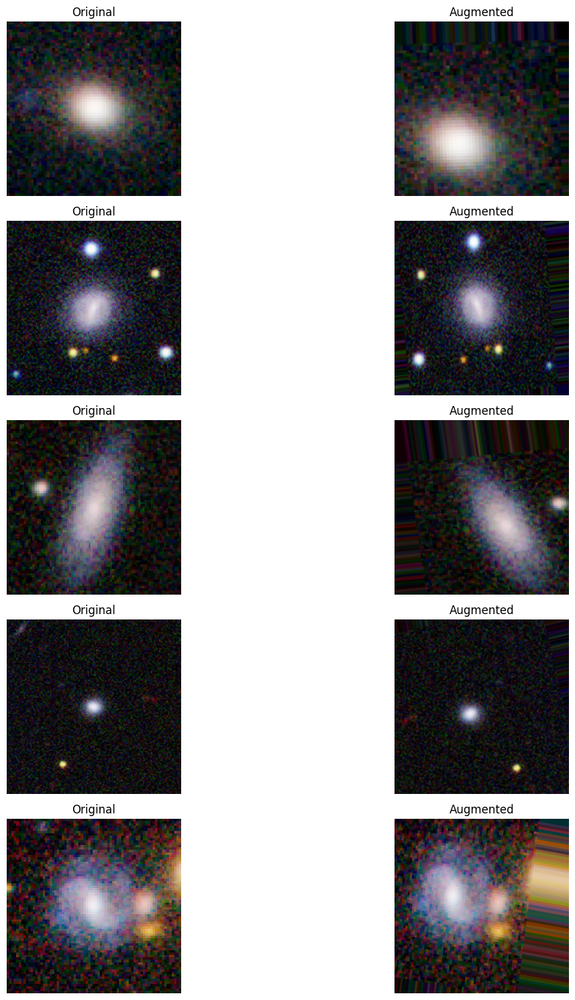

In [7]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os

# Function to display an original image and its augmented version
def display_original_and_augmented(original_images, augmented_images, sample_count=5):
    plt.figure(figsize=(15, 3 * sample_count))
    for i in range(sample_count):
        # Original image
        plt.subplot(sample_count, 2, 2 * i + 1)
        plt.imshow(original_images[i].astype("uint8"))
        plt.title("Original")
        plt.axis("off")

        # Augmented image
        plt.subplot(sample_count, 2, 2 * i + 2)
        plt.imshow(augmented_images[i].astype("uint8"))
        plt.title("Augmented")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

# Load images into a NumPy array (assuming images and labels are already loaded as `images` and `labels`)
def load_images(image_names, image_dir):
    images = []
    for name in image_names:
        img_path = os.path.join(image_dir, name + '_giH.png')
        img = tf.keras.preprocessing.image.load_img(img_path, target_size=(300, 300))
        img_array = tf.keras.preprocessing.image.img_to_array(img)
        images.append(img_array)
    return np.array(images)

# Assume we have `image_names` and `labels` already loaded
# Load a subset of images for visualization
subset_count = 5  # Number of samples to visualize
original_images = images[:subset_count]

# Data augmentation configuration
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Generate augmented images
augmented_images = []
for img in original_images:
    img_expanded = np.expand_dims(img, axis=0)  # Add batch dimension
    aug_iter = datagen.flow(img_expanded, batch_size=1)
    augmented_img = next(aug_iter)[0]  # Take the first (and only) augmented image
    augmented_images.append(augmented_img)

augmented_images = np.array(augmented_images)

# Display original and augmented images side by side
display_original_and_augmented(original_images, augmented_images, sample_count=subset_count)


In [8]:
# Function to calculate dataset statistics
def calculate_dataset_stats(labels, augmented_factor):
    total_images = len(labels)
    elliptical_count = np.sum(labels == 0)
    other_count = np.sum(labels == 1)
    total_augmented_images = total_images * augmented_factor

    print(f"Total images in dataset: {total_images}")
    print(f"Elliptical galaxies: {elliptical_count}")
    print(f"Other galaxies: {other_count}")
    print(f"Total images after augmentation: {total_augmented_images}")

# Calculate dataset statistics
calculate_dataset_stats(labels, augmented_factor=5)  # Assuming each image is augmented 5 times


Total images in dataset: 5900
Elliptical galaxies: 2894
Other galaxies: 3006
Total images after augmentation: 29500


In [9]:
# Function to calculate and display train-test split statistics
def calculate_train_test_split(train_labels, val_labels, augmented_factor):
    train_total = len(train_labels) * augmented_factor
    val_total = len(val_labels)
    train_elliptical = np.sum(train_labels == 0) * augmented_factor
    train_other = np.sum(train_labels == 1) * augmented_factor
    val_elliptical = np.sum(val_labels == 0)
    val_other = np.sum(val_labels == 1)

    print("\nTrain-Test Split Statistics:")
    print(f"Total training images: {train_total}")
    print(f"  Elliptical galaxies in training: {train_elliptical}")
    print(f"  Other galaxies in training: {train_other}")
    print(f"Total validation images: {val_total}")
    print(f"  Elliptical galaxies in validation: {val_elliptical}")
    print(f"  Other galaxies in validation: {val_other}")

# Calculate train-test split statistics
calculate_train_test_split(train_labels, val_labels, augmented_factor=5)



Train-Test Split Statistics:
Total training images: 23600
  Elliptical galaxies in training: 11715
  Other galaxies in training: 11885
Total validation images: 1180
  Elliptical galaxies in validation: 551
  Other galaxies in validation: 629


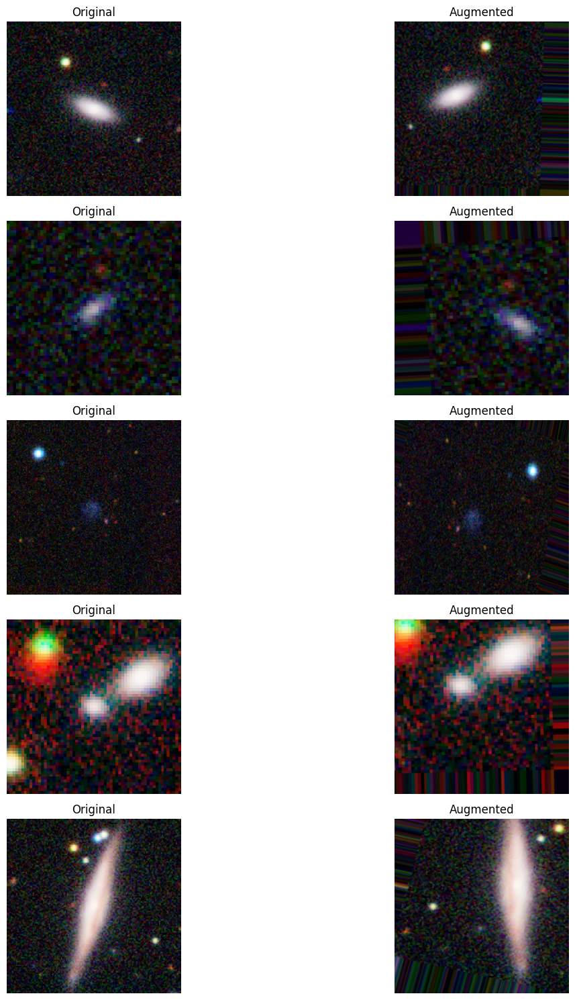

Total images in dataset: 5900
Elliptical galaxies: 2894
Other galaxies: 3006
Total images after augmentation: 29500

Train-Test Split Statistics:
Total training images: 23600
  Elliptical galaxies in training: 11590
  Other galaxies in training: 12010
Total validation images: 1180
  Elliptical galaxies in validation: 576
  Other galaxies in validation: 604


In [47]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import os

# Function to display an original image and its augmented version
def display_original_and_augmented(original_images, augmented_images, sample_count=5):
    plt.figure(figsize=(15, 3 * sample_count))
    for i in range(sample_count):
        # Original image
        plt.subplot(sample_count, 2, 2 * i + 1)
        plt.imshow(original_images[i].astype("uint8"))
        plt.title("Original")
        plt.axis("off")

        # Augmented image
        plt.subplot(sample_count, 2, 2 * i + 2)
        plt.imshow(augmented_images[i].astype("uint8"))
        plt.title("Augmented")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

# Function to load images into a NumPy array
def load_images(image_names, image_dir):
    images = []
    for name in image_names:
        img_path = os.path.join(image_dir, name + '_giH.png')
        img = tf.keras.preprocessing.image.load_img(img_path, target_size=(300, 300))
        img_array = tf.keras.preprocessing.image.img_to_array(img)
        images.append(img_array)
    return np.array(images)

# Function to calculate dataset statistics
def calculate_dataset_stats(labels, augmented_factor):
    total_images = len(labels)
    elliptical_count = np.sum(labels == 0)
    other_count = np.sum(labels == 1)
    total_augmented_images = total_images * augmented_factor

    print(f"Total images in dataset: {total_images}")
    print(f"Elliptical galaxies: {elliptical_count}")
    print(f"Other galaxies: {other_count}")
    print(f"Total images after augmentation: {total_augmented_images}")

# Function to calculate and display train-test split statistics
def calculate_train_test_split(train_labels, val_labels, augmented_factor):
    train_total = len(train_labels) * augmented_factor
    val_total = len(val_labels) * augmented_factor // 5
    train_elliptical = np.sum(train_labels == 0) * augmented_factor
    train_other = np.sum(train_labels == 1) * augmented_factor
    val_elliptical = np.sum(val_labels == 0) * augmented_factor // 5
    val_other = np.sum(val_labels == 1) * augmented_factor // 5

    print("\nTrain-Test Split Statistics:")
    print(f"Total training images: {train_total}")
    print(f"  Elliptical galaxies in training: {train_elliptical}")
    print(f"  Other galaxies in training: {train_other}")
    print(f"Total validation images: {val_total}")
    print(f"  Elliptical galaxies in validation: {val_elliptical}")
    print(f"  Other galaxies in validation: {val_other}")

# Adjust train-validation split to 80-20
split_ratio = 0.8
split_index = int(split_ratio * len(labels))

train_labels = labels[:split_index]
val_labels = labels[split_index:]

# Ensure validation set is 20% of the augmented dataset
val_count = int(len(labels) * 5 * (1 - split_ratio))
train_count = int(len(labels) * 5 * split_ratio)

train_labels = labels[:train_count // 5]
val_labels = labels[train_count // 5:]

# Assume we have `image_names` and `labels` already loaded
# Load a subset of images for visualization
subset_count = 5  # Number of samples to visualize
original_images = images[:subset_count]

# Data augmentation configuration
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.15,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Generate augmented images
augmented_images = []
for img in original_images:
    img_expanded = np.expand_dims(img, axis=0)  # Add batch dimension
    aug_iter = datagen.flow(img_expanded, batch_size=1)
    augmented_img = next(aug_iter)[0]  # Take the first (and only) augmented image
    augmented_images.append(augmented_img)

augmented_images = np.array(augmented_images)

# Display original and augmented images side by side
display_original_and_augmented(original_images, augmented_images, sample_count=subset_count)

# Calculate dataset statistics
calculate_dataset_stats(labels, augmented_factor=5)  # Assuming each image is augmented 5 times

# Calculate train-test split statistics
calculate_train_test_split(train_labels, val_labels, augmented_factor=5)




In [49]:
strategy = tf.distribute.MirroredStrategy()

In [9]:
with strategy.scope():
    # Define the model
    model = Sequential([
        Conv2D(32, (3, 3), activation='relu', input_shape=(300, 300, 3)),
        BatchNormalization(),
        MaxPooling2D(pool_size=(2, 2)),
        Dropout(0.25),
        
        Conv2D(64, (3, 3), activation='relu'),
        BatchNormalization(),
        MaxPooling2D(pool_size=(2, 2)),
        Dropout(0.25),
        
        Conv2D(128, (3, 3), activation='relu'),
        BatchNormalization(),
        MaxPooling2D(pool_size=(2, 2)),
        Dropout(0.25),
        
        Flatten(),
        Dense(512, activation='relu'),
        BatchNormalization(),
        Dropout(0.5),
        
        Dense(1, activation='sigmoid')
    ])
    # Compile the model
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    
    # Define the callback to save the best model
    checkpoint_path = "/kaggle/working/best_model.keras"
    checkpoint = ModelCheckpoint(
        checkpoint_path, monitor='val_accuracy', save_best_only=True, mode='max', verbose=1
    )


In [10]:
# Train the model
history = model.fit(
    datagen.flow(train_images, train_labels, batch_size=32),
    epochs=20,
    validation_data=(val_images, val_labels),
    class_weight=class_weights,
    callbacks=[checkpoint]
)



Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


148/148 ━━━━━━━━━━━━━━━━━━━━ 0s 557ms/step - accuracy: 0.6717 - loss: 0.8133
Epoch 1: val_accuracy improved from -inf to 0.70000, saving model to /kaggle/working/best_model.keras
148/148 ━━━━━━━━━━━━━━━━━━━━ 113s 637ms/step - accuracy: 0.6717 - loss: 0.8128 - val_accuracy: 0.7000 - val_loss: 0.6376
Epoch 2/20
148/148 ━━━━━━━━━━━━━━━━━━━━ 0s 577ms/step - accuracy: 0.7140 - loss: 0.6504
Epoch 2: val_accuracy improved from 0.70000 to 0.76780, saving model to /kaggle/working/best_model.keras
148/148 ━━━━━━━━━━━━━━━━━━━━ 97s 629ms/step - accuracy: 0.7140 - loss: 0.6503 - val_accuracy: 0.7678 - val_loss: 0.5050
Epoch 3/20
148/148 ━━━━━━━━━━━━━━━━━━━━ 0s 565ms/step - accuracy: 0.7325 - loss: 0.5819
Epoch 3: val_accuracy improved from 0.76780 to 0.81186, saving model to /kaggle/working/best_model.keras
148/148 ━━━━━━━━━━━━━━━━━━━━ 95s 617ms/step - accuracy: 0.7326 - loss: 0.5818 - val_accuracy: 0.8119 - val_loss: 0.4424
Epoch 4/20
148/148 ━━━━━━━━━━━━━━━━━━━━ 0s 560ms/step - accuracy: 0.7694 -

In [8]:
# Load the best model (if needed)
model = tf.keras.models.load_model('/kaggle/input/bestmodel/keras/default/1/best_model.keras')

# Evaluate the best model
loss, accuracy = model.evaluate(val_images, val_labels, verbose=1)
print(f"Best Model Accuracy: {accuracy:.2f}")

37/37 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.8385 - loss: 0.4079
Best Model Accuracy: 0.84


In [27]:
print(model.history.history['accuracy'])

KeyError: 'accuracy'

37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - accuracy: 0.8385 - loss: 0.4079
Validation Loss: 0.4067366421222687
Validation Accuracy: 0.8389830589294434
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step
              precision    recall  f1-score   support

  Elliptical       0.78      0.93      0.85       576
       Other       0.91      0.76      0.83       604

    accuracy                           0.84      1180
   macro avg       0.85      0.84      0.84      1180
weighted avg       0.85      0.84      0.84      1180



KeyError: 'accuracy'

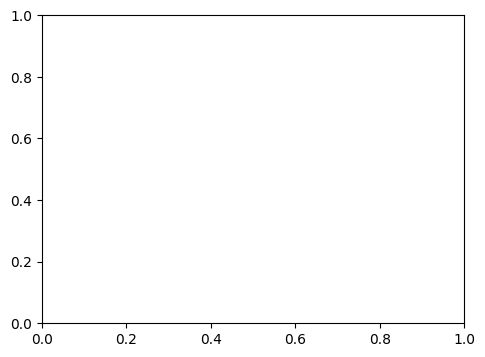

In [26]:
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
# Evaluate the model
val_loss, val_accuracy = model.evaluate(val_images, val_labels)
print(f'Validation Loss: {val_loss}')
print(f'Validation Accuracy: {val_accuracy}')

# Generate classification report
pred_labels = (model.predict(val_images) > 0.5).astype("int32")
print(classification_report(val_labels, pred_labels, target_names=['Elliptical', 'Other']))

# Plot training & validation accuracy and loss
def plot_history(history):
    plt.figure(figsize=(12, 4))
    
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Val Accuracy')
    plt.title('Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.title('Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    
    plt.show()

plot_history(model.history)


37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step
Confusion Matrix (Text Format):
[[533  43]
 [147 457]]


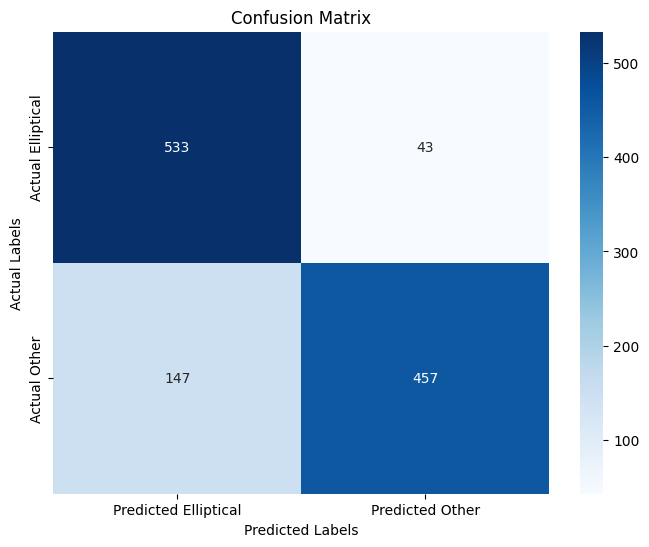

In [30]:
pred_probs = model.predict(val_images)
pred_labels = (pred_probs > 0.5).astype("int32")  # Assuming binary classification

from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Generate Confusion Matrix
cm = confusion_matrix(val_labels, pred_labels)

# Print Confusion Matrix (text format)
print("Confusion Matrix (Text Format):")
print(cm)

# Plot Confusion Matrix (visual format, using Seaborn)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap="Blues", fmt='d',
            xticklabels=['Predicted Elliptical', 'Predicted Other'],
            yticklabels=['Actual Elliptical', 'Actual Other'])
plt.xlabel("Predicted Labels")
plt.ylabel("Actual Labels")
plt.title("Confusion Matrix")
plt.show()

In [74]:
with strategy.scope():
        
    callbacks = [
    
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3),
    ModelCheckpoint(filepath='best_model.keras', monitor='val_loss', save_best_only=True)
    ]

    # Training configuration
    model = tf.keras.Sequential([
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(300, 300, 3)),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
        tf.keras.layers.Dropout(0.25),
    
        tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
        tf.keras.layers.Dropout(0.25),
    
        tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
        tf.keras.layers.Dropout(0.25),
    
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(512, activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dropout(0.5),
    
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])
    
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    # Calculate class weights
    class_weights = class_weight.compute_class_weight(class_weight='balanced', classes=np.unique(train_labels), y=train_labels)
    class_weights = {i: class_weights[i] for i in range(len(class_weights))}
    # Train the model
    history = model.fit(
        datagen.flow(train_images, train_labels, batch_size=32),
        epochs=30,
        validation_data=(val_images, val_labels),
        callbacks=callbacks,
        class_weight=class_weights
    )

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/30


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


148/148 ━━━━━━━━━━━━━━━━━━━━ 109s 658ms/step - accuracy: 0.6858 - loss: 0.7631 - val_accuracy: 0.7576 - val_loss: 0.6240 - learning_rate: 0.0010
Epoch 2/30
148/148 ━━━━━━━━━━━━━━━━━━━━ 96s 618ms/step - accuracy: 0.7416 - loss: 0.6019 - val_accuracy: 0.7220 - val_loss: 0.5887 - learning_rate: 0.0010
Epoch 3/30
148/148 ━━━━━━━━━━━━━━━━━━━━ 91s 589ms/step - accuracy: 0.7606 - loss: 0.5304 - val_accuracy: 0.6780 - val_loss: 0.6900 - learning_rate: 0.0010
Epoch 4/30
148/148 ━━━━━━━━━━━━━━━━━━━━ 96s 623ms/step - accuracy: 0.7905 - loss: 0.4763 - val_accuracy: 0.7695 - val_loss: 0.5316 - learning_rate: 0.0010
Epoch 5/30
148/148 ━━━━━━━━━━━━━━━━━━━━ 90s 578ms/step - accuracy: 0.7884 - loss: 0.4861 - val_accuracy: 0.5288 - val_loss: 6.3474 - learning_rate: 0.0010
Epoch 6/30
148/148 ━━━━━━━━━━━━━━━━━━━━ 94s 609ms/step - accuracy: 0.7798 - loss: 0.4827 - val_accuracy: 0.8051 - val_loss: 0.4501 - learning_rate: 0.0010
Epoch 7/30
148/148 ━━━━━━━━━━━━━━━━━━━━ 98s 632ms/step - accuracy: 0.8157 - loss

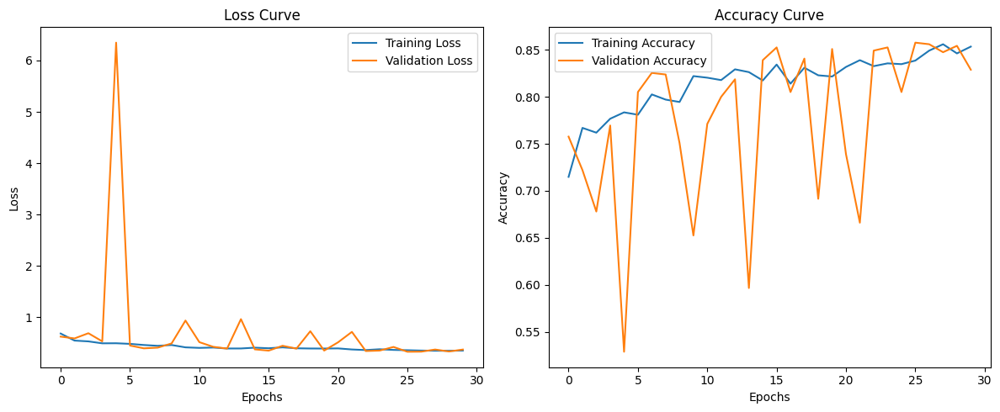

In [75]:
# Plot training and validation curves
def plot_training_curves(history):
    plt.figure(figsize=(12, 5))

    # Loss curve
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss Curve')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # Accuracy curve
    plt.subplot(1, 2, 2)
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy Curve')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_training_curves(history)


In [54]:
import pandas as pd

# Convert the history object to a DataFrame
history_df = pd.DataFrame(history.history)

# Save to CSV
history_df.to_csv('model_training_history.csv', index=False)

37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step
Confusion Matrix (Text Format):
[[453 123]
 [ 66 538]]


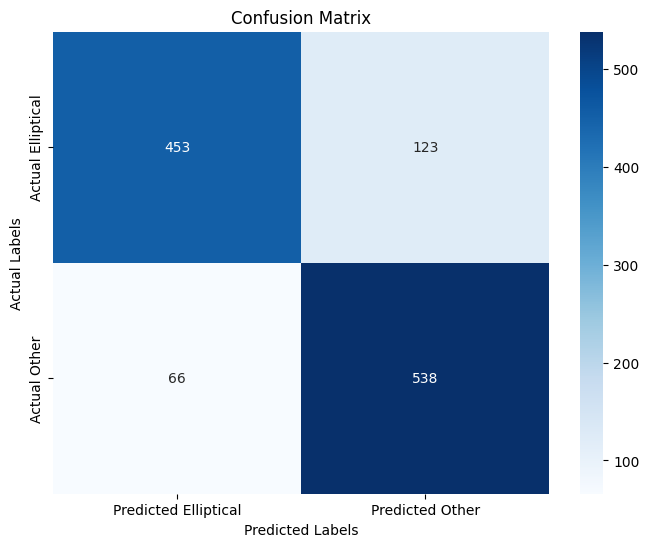

In [76]:
pred_probs = model.predict(val_images)
pred_labels = (pred_probs > 0.5).astype("int32")  # Assuming binary classification

from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Generate Confusion Matrix
cm = confusion_matrix(val_labels, pred_labels)

# Print Confusion Matrix (text format)
print("Confusion Matrix (Text Format):")
print(cm)

# Plot Confusion Matrix (visual format, using Seaborn)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap="Blues", fmt='d',
            xticklabels=['Predicted Elliptical', 'Predicted Other'],
            yticklabels=['Actual Elliptical', 'Actual Other'])
plt.xlabel("Predicted Labels")
plt.ylabel("Actual Labels")
plt.title("Confusion Matrix")
plt.show()

37/37 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step - accuracy: 0.8547 - loss: 0.3515
Validation Loss: 0.372130423784256
Validation Accuracy: 0.8288135528564453
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step
              precision    recall  f1-score   support

  Elliptical       0.87      0.79      0.83       576
       Other       0.81      0.89      0.85       604

    accuracy                           0.84      1180
   macro avg       0.84      0.84      0.84      1180
weighted avg       0.84      0.84      0.84      1180



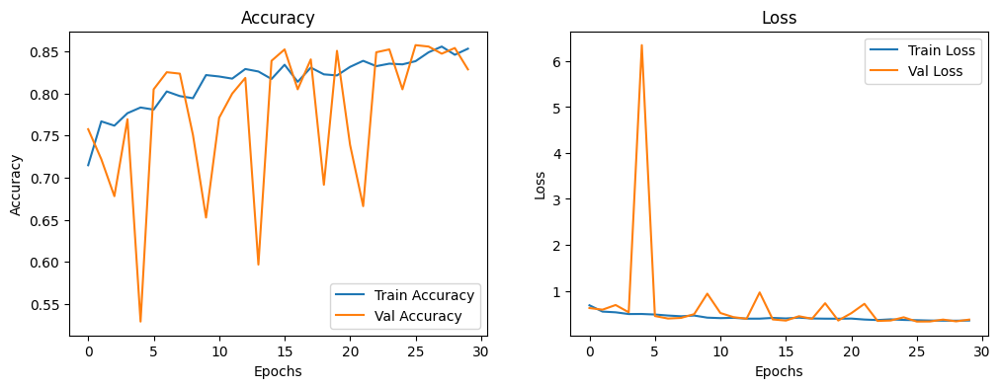

In [77]:
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
# Evaluate the model
val_loss, val_accuracy = model.evaluate(val_images, val_labels)
print(f'Validation Loss: {val_loss}')
print(f'Validation Accuracy: {val_accuracy}')

# Generate classification report
pred_labels = (model.predict(val_images) > 0.5).astype("int32")
print(classification_report(val_labels, pred_labels, target_names=['Elliptical', 'Other']))

# Plot training & validation accuracy and loss
def plot_history(history):
    plt.figure(figsize=(12, 4))
    
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Val Accuracy')
    plt.title('Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.title('Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    
    plt.show()

plot_history(history)


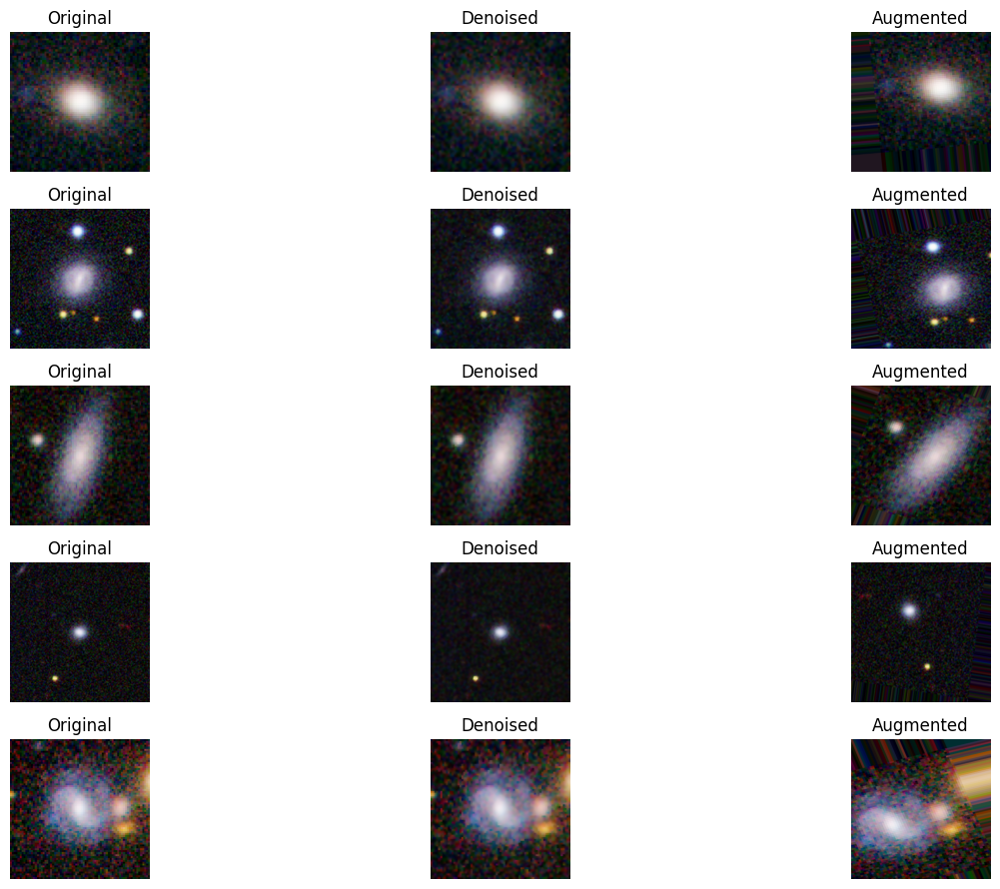

Total images in dataset: 5900
Elliptical galaxies: 2894
Other galaxies: 3006
Total images after augmentation: 29500

Train-Test Split Statistics:
Total training images: 23600
  Elliptical galaxies in training: 11715
  Other galaxies in training: 11885
Total validation images: 5900
  Elliptical galaxies in validation: 2755
  Other galaxies in validation: 3145
Epoch 1/10
148/148 ━━━━━━━━━━━━━━━━━━━━ 112s 670ms/step - accuracy: 0.6872 - loss: 13.9211 - val_accuracy: 0.8797 - val_loss: 0.2860 - learning_rate: 0.0010
Epoch 2/10
148/148 ━━━━━━━━━━━━━━━━━━━━ 96s 624ms/step - accuracy: 0.7972 - loss: 0.4424 - val_accuracy: 0.8932 - val_loss: 0.2564 - learning_rate: 0.0010
Epoch 3/10
148/148 ━━━━━━━━━━━━━━━━━━━━ 88s 566ms/step - accuracy: 0.8194 - loss: 0.4231 - val_accuracy: 0.8805 - val_loss: 0.2809 - learning_rate: 0.0010
Epoch 4/10
148/148 ━━━━━━━━━━━━━━━━━━━━ 87s 560ms/step - accuracy: 0.8248 - loss: 0.4076 - val_accuracy: 0.8966 - val_loss: 0.2729 - learning_rate: 0.0010
Epoch 5/10
148/14

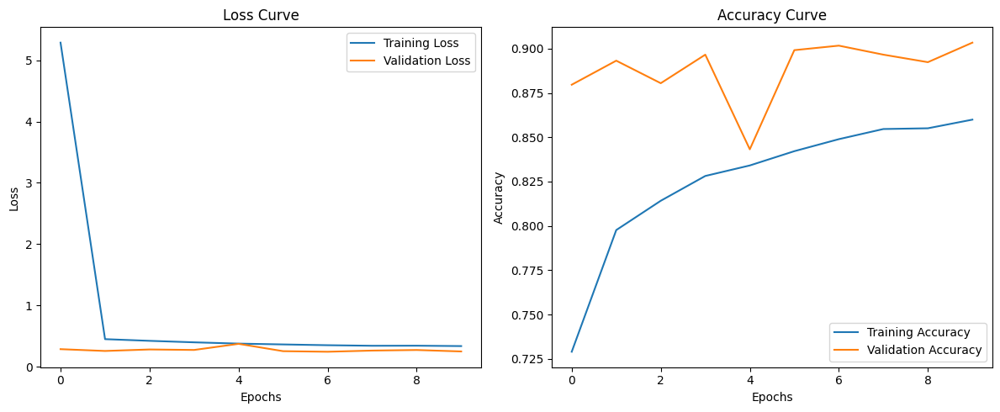

In [12]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.models import Model
import cv2
import os

# Function to display original, denoised, and augmented images
def display_images(original_images, denoised_images, augmented_images, sample_count=5):
    plt.figure(figsize=(15, 9))
    for i in range(sample_count):
        # Original image
        plt.subplot(sample_count, 3, 3 * i + 1)
        plt.imshow(original_images[i].astype("uint8"))
        plt.title("Original")
        plt.axis("off")

        # Denoised image
        plt.subplot(sample_count, 3, 3 * i + 2)
        plt.imshow(denoised_images[i].astype("uint8"))
        plt.title("Denoised")
        plt.axis("off")

        # Augmented image
        plt.subplot(sample_count, 3, 3 * i + 3)
        plt.imshow(augmented_images[i].astype("uint8"))
        plt.title("Augmented")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

# Function to load images into a NumPy array
def load_images(image_names, image_dir):
    images = []
    for name in image_names:
        img_path = os.path.join(image_dir, name + '_giH.png')
        img = tf.keras.preprocessing.image.load_img(img_path, target_size=(300, 300))
        img_array = tf.keras.preprocessing.image.img_to_array(img)
        images.append(img_array)
    return np.array(images)

# Function to apply bilateral denoising to images
def denoise_images(images):
    denoised = []
    for img in images:
        img = img.astype(np.uint8)
        denoised_img = cv2.bilateralFilter(img, d=9, sigmaColor=75, sigmaSpace=75)
        denoised.append(denoised_img)
    return np.array(denoised)

# Function to calculate dataset statistics
def calculate_dataset_stats(labels, augmented_factor):
    total_images = len(labels)
    elliptical_count = np.sum(labels == 0)
    other_count = np.sum(labels == 1)
    total_augmented_images = total_images * augmented_factor

    print(f"Total images in dataset: {total_images}")
    print(f"Elliptical galaxies: {elliptical_count}")
    print(f"Other galaxies: {other_count}")
    print(f"Total images after augmentation: {total_augmented_images}")

# Function to calculate and display train-test split statistics
def calculate_train_test_split(train_labels, val_labels, augmented_factor):
    train_total = len(train_labels) * augmented_factor
    val_total = len(val_labels) * augmented_factor
    train_elliptical = np.sum(train_labels == 0) * augmented_factor
    train_other = np.sum(train_labels == 1) * augmented_factor
    val_elliptical = np.sum(val_labels == 0) * augmented_factor
    val_other = np.sum(val_labels == 1) * augmented_factor

    print("\nTrain-Test Split Statistics:")
    print(f"Total training images: {train_total}")
    print(f"  Elliptical galaxies in training: {train_elliptical}")
    print(f"  Other galaxies in training: {train_other}")
    print(f"Total validation images: {val_total}")
    print(f"  Elliptical galaxies in validation: {val_elliptical}")
    print(f"  Other galaxies in validation: {val_other}")

# Adjust train-validation split to 80-20
split_ratio = 0.8
split_index = int(split_ratio * len(labels))

train_labels = labels[:split_index]
val_labels = labels[split_index:]

# Ensure validation set is 20% of the augmented dataset
val_count = int(len(labels) * 5 * (1 - split_ratio))
train_count = int(len(labels) * 5 * split_ratio)

train_labels = labels[:train_count // 5]
val_labels = labels[train_count // 5:]

# Assume we have `image_names` and `labels` already loaded
# Load a subset of images for visualization
subset_count = 5  # Number of samples to visualize
original_images = images[:subset_count]

# Apply bilateral denoising
denoised_images = denoise_images(original_images)

# Data augmentation configuration
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Generate augmented images
augmented_images = []
for img in original_images:
    img_expanded = np.expand_dims(img, axis=0)  # Add batch dimension
    aug_iter = datagen.flow(img_expanded, batch_size=1)
    augmented_img = next(aug_iter)[0]  # Take the first (and only) augmented image
    augmented_images.append(augmented_img)

augmented_images = np.array(augmented_images)

# Display original, denoised, and augmented images side by side
display_images(original_images, denoised_images, augmented_images, sample_count=subset_count)

# Calculate dataset statistics
calculate_dataset_stats(labels, augmented_factor=5)  # Assuming each image is augmented 5 times

# Calculate train-test split statistics
calculate_train_test_split(train_labels, val_labels, augmented_factor=5)

# Callbacks for training
callbacks = [
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3),
    ModelCheckpoint(filepath='/kaggle/working/thebest_model.keras', monitor='val_loss', save_best_only=True)
]

# Load pre-trained ResNet50
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(300, 300, 3))

# Freeze base model layers
for layer in base_model.layers:
    layer.trainable = False

# Add custom layers
x = Flatten()(base_model.output)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(1, activation='sigmoid')(x)

model = Model(inputs=base_model.input, outputs=output)

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
denoised_train_images = denoise_images(train_images)  # Apply bilateral denoising to training images
denoised_val_images = denoise_images(val_images)  # Apply bilateral denoising to validation images

# Train the model
history = model.fit(
    datagen.flow(denoised_train_images, train_labels, batch_size=32),
    epochs=10,
    validation_data=(denoised_val_images, val_labels),
    callbacks=callbacks
)

# Plot training and validation curves
def plot_training_curves(history):
    plt.figure(figsize=(12, 5))

    # Loss curve
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss Curve')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # Accuracy curve
    plt.subplot(1, 2, 2)
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy Curve')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_training_curves(history)


37/37 ━━━━━━━━━━━━━━━━━━━━ 7s 182ms/step
Classification Report:
              precision    recall  f1-score   support

  Elliptical       0.98      0.24      0.38       551
       Other       0.60      1.00      0.75       629

    accuracy                           0.64      1180
   macro avg       0.79      0.62      0.56      1180
weighted avg       0.78      0.64      0.58      1180



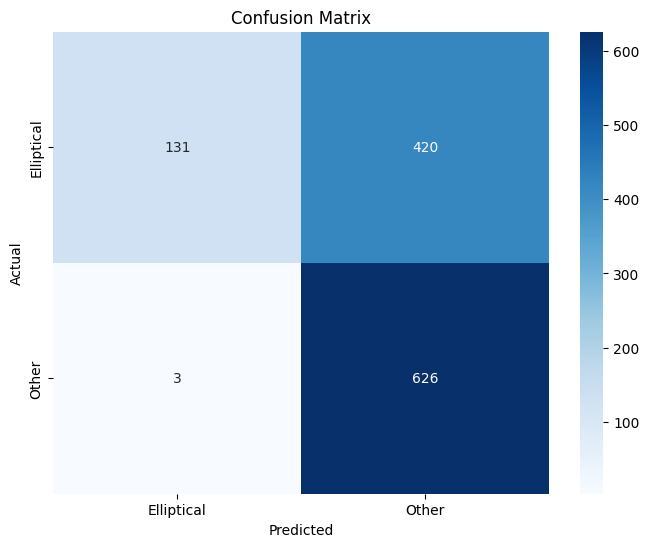

In [20]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

# Generate predictions
val_predictions = model.predict(val_images)  # Predict probabilities
val_predictions = (val_predictions > 0.5).astype(int)  # Convert probabilities to binary classes

# Generate classification report
print("Classification Report:")
print(classification_report(val_labels, val_predictions, target_names=["Elliptical", "Other"]))

# Generate confusion matrix
conf_matrix = confusion_matrix(val_labels, val_predictions)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=["Elliptical", "Other"], yticklabels=["Elliptical", "Other"])
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()


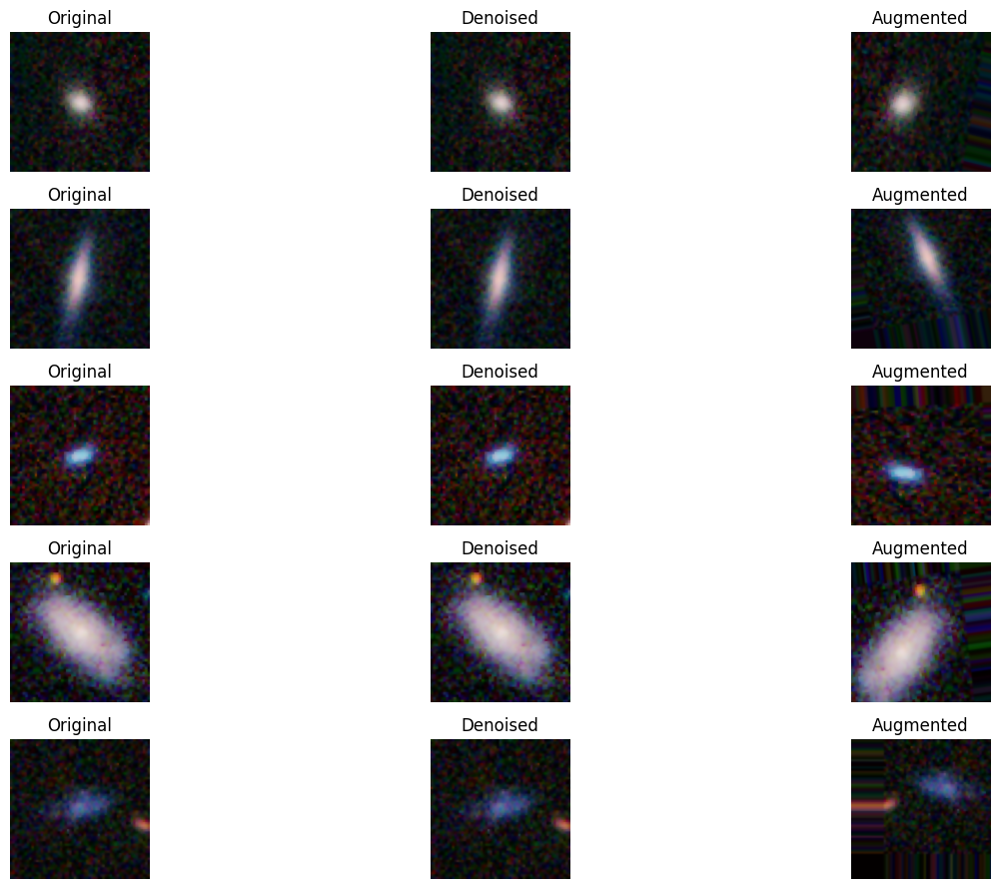

Total images in dataset: 5900
Elliptical galaxies: 0
Other galaxies: 0
Total images after augmentation: 29500

Train-Test Split Statistics:
Total training images: 23600
  Elliptical galaxies in training: 0
  Other galaxies in training: 0
Total validation images: 5900
  Elliptical galaxies in validation: 0
  Other galaxies in validation: 0


In [8]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.models import Model
import cv2
import os

# Function to display original, denoised, and augmented images
def display_images(original_images, denoised_images, augmented_images, sample_count=5):
    plt.figure(figsize=(15, 9))
    for i in range(sample_count):
        # Original image
        plt.subplot(sample_count, 3, 3 * i + 1)
        plt.imshow(original_images[i].astype("uint8"))
        plt.title("Original")
        plt.axis("off")

        # Denoised image
        plt.subplot(sample_count, 3, 3 * i + 2)
        plt.imshow(denoised_images[i].astype("uint8"))
        plt.title("Denoised")
        plt.axis("off")

        # Augmented image
        plt.subplot(sample_count, 3, 3 * i + 3)
        plt.imshow(augmented_images[i].astype("uint8"))
        plt.title("Augmented")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

# Function to load images into a NumPy array
def load_images(image_names, image_dir):
    images = []
    for name in image_names:
        img_path = os.path.join(image_dir, name + '_giH.png')
        img = tf.keras.preprocessing.image.load_img(img_path, target_size=(300, 300))
        img_array = tf.keras.preprocessing.image.img_to_array(img)
        images.append(img_array)
    return np.array(images)


# Function to calculate dataset statistics
def calculate_dataset_stats(labels, augmented_factor):
    total_images = len(labels)
    elliptical_count = np.sum(labels == 0)
    other_count = np.sum(labels == 1)
    total_augmented_images = total_images * augmented_factor

    print(f"Total images in dataset: {total_images}")
    print(f"Elliptical galaxies: {elliptical_count}")
    print(f"Other galaxies: {other_count}")
    print(f"Total images after augmentation: {total_augmented_images}")

# Function to calculate and display train-test split statistics
def calculate_train_test_split(train_labels, val_labels, augmented_factor):
    train_total = len(train_labels) * augmented_factor
    val_total = len(val_labels) * augmented_factor
    train_elliptical = np.sum(train_labels == 0) * augmented_factor
    train_other = np.sum(train_labels == 1) * augmented_factor
    val_elliptical = np.sum(val_labels == 0) * augmented_factor
    val_other = np.sum(val_labels == 1) * augmented_factor

    print("\nTrain-Test Split Statistics:")
    print(f"Total training images: {train_total}")
    print(f"  Elliptical galaxies in training: {train_elliptical}")
    print(f"  Other galaxies in training: {train_other}")
    print(f"Total validation images: {val_total}")
    print(f"  Elliptical galaxies in validation: {val_elliptical}")
    print(f"  Other galaxies in validation: {val_other}")

# Adjust train-validation split to 80-20
split_ratio = 0.8
split_index = int(split_ratio * len(labels))

train_labels = labels[:split_index]
val_labels = labels[split_index:]

# Ensure validation set is 20% of the augmented dataset
val_count = int(len(labels) * 5 * (1 - split_ratio))
train_count = int(len(labels) * 5 * split_ratio)

train_labels = labels[:train_count // 5]
val_labels = labels[train_count // 5:]

# Assume we have `image_names` and `labels` already loaded
# Load a subset of images for visualization
subset_count = 5  # Number of samples to visualize

denoised_image_dir='/kaggle/input/denoised-data/denoised-bilateralFilter/DATA'
denoised_images=load_images(image_names,denoised_image_dir)
# Data augmentation configuration
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Generate augmented images
augmented_images = []
for img in denoised_images:
    img_expanded = np.expand_dims(img, axis=0)  # Add batch dimension
    aug_iter = datagen.flow(img_expanded, batch_size=1)
    augmented_img = next(aug_iter)[0]  # Take the first (and only) augmented image
    augmented_images.append(augmented_img)

augmented_images = np.array(augmented_images)

# Display original, denoised, and augmented images side by side
display_images(denoised_images, denoised_images, augmented_images, sample_count=subset_count)

# Calculate dataset statistics
calculate_dataset_stats(labels, augmented_factor=5)  # Assuming each image is augmented 5 times

# Calculate train-test split statistics
calculate_train_test_split(train_labels, val_labels, augmented_factor=5)






In [36]:


print(len(val_labels))

1180


In [34]:
#images = load_images(image_names, denoised_image_dir)
#labels = np.array(labels)
# Split the data into training and validation sets
split_index = int(0.8 * len(images))
train_images, val_images = images[:split_index], images[split_index:]
train_labels, val_labels = labels[:split_index], labels[split_index:]


In [8]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Create a data generator
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.3
)

# Load denoised images
train_generator = datagen.(
    ,
    target_size=(300, 300),
    batch_size=32,
    
)

val_generator = datagen.flow_from_directory(
    denoised_image_dir,
    target_size=(300, 300),
    batch_size=32,
    class_mode='binary',
    subset='validation'
)


Found 0 images belonging to 0 classes.
Found 0 images belonging to 0 classes.


In [10]:
class_weights = class_weight.compute_class_weight(class_weight='balanced', classes=np.unique(train_labels), y=train_labels)
class_weights = {i: class_weights[i] for i in range(len(class_weights))}

In [15]:
# Callbacks for training
callbacks = [
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3),
    ModelCheckpoint(filepath='/kaggle/working/baseline_resnet50.keras', monitor='val_loss', save_best_only=True)
]


# Load pre-trained ResNet50 (frozen layers)
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(300, 300, 3))
for layer in base_model.layers:
    layer.trainable = False

# Add custom layers
x = Flatten()(base_model.output)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(1, activation='sigmoid')(x)
model = Model(inputs=base_model.input, outputs=output)

# Compile model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
# Train model
history_baseline = model.fit(
    datagen.flow(train_images,train_labels),
    validation_data=(val_images,val_labels),
    epochs=20,
    callbacks=callbacks,
    class_weight=class_weights
)


94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


148/148 ━━━━━━━━━━━━━━━━━━━━ 127s 728ms/step - accuracy: 0.6606 - loss: 16.1459 - val_accuracy: 0.8466 - val_loss: 0.3793 - learning_rate: 0.0010
Epoch 2/20
148/148 ━━━━━━━━━━━━━━━━━━━━ 99s 641ms/step - accuracy: 0.7640 - loss: 0.4804 - val_accuracy: 0.8297 - val_loss: 0.3964 - learning_rate: 0.0010
Epoch 3/20
148/148 ━━━━━━━━━━━━━━━━━━━━ 95s 611ms/step - accuracy: 0.7610 - loss: 0.4612 - val_accuracy: 0.8568 - val_loss: 0.3822 - learning_rate: 0.0010
Epoch 4/20
148/148 ━━━━━━━━━━━━━━━━━━━━ 95s 615ms/step - accuracy: 0.7923 - loss: 0.4336 - val_accuracy: 0.8415 - val_loss: 0.3964 - learning_rate: 0.0010
Epoch 5/20
148/148 ━━━━━━━━━━━━━━━━━━━━ 99s 640ms/step - accuracy: 0.7983 - loss: 0.4033 - val_accuracy: 0.8703 - val_loss: 0.2981 - learning_rate: 5.0000e-04
Epoch 6/20
148/148 ━━━━━━━━━━━━━━━━━━━━ 97s 624ms/step - accuracy: 0.8171 - loss: 0.3709 - val_accuracy: 0.8712 - val_loss: 0.3350 - learning_rate: 5.0000e-04
Epoch 7/20
148/148 ━━━━━━━━━━━━━━━━━━━━ 103s 669ms/step - accuracy: 0.8

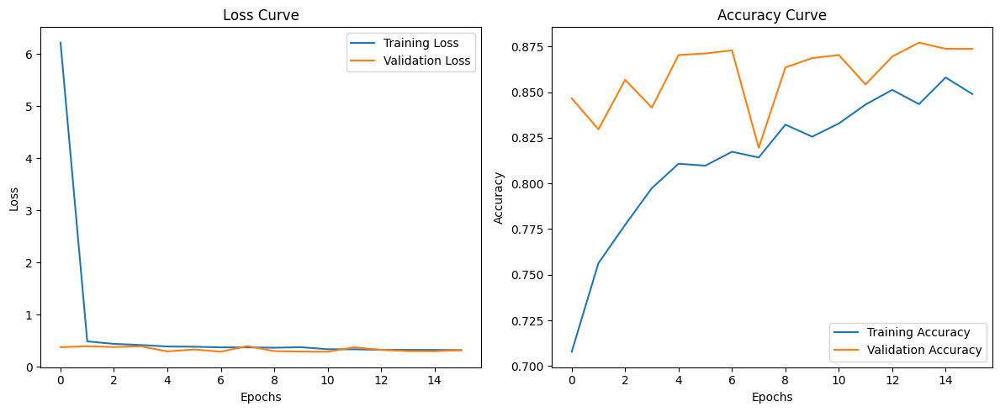

In [17]:

# Plot training and validation curves
def plot_training_curves(history):
    plt.figure(figsize=(12, 5))

    # Loss curve
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss Curve')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # Accuracy curve
    plt.subplot(1, 2, 2)
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy Curve')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_training_curves(history_baseline)


In [28]:
val_datagen=ImageDataGenerator()
val_generator = val_datagen.flow(
    val_images,
    val_labels,
    batch_size=32,
    shuffle=False  # Usually False for validation
)
train_generator = datagen.flow(
    train_images,
    train_labels,
    batch_size=32,
    shuffle=True
)


In [30]:
# Unfreeze last few layers of ResNet50 for fine-tuning
for layer in base_model.layers[:-20]:
    layer.trainable = False
for layer in base_model.layers[-20:]:
    layer.trainable = True

# Recompile model
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5), loss='binary_crossentropy', metrics=['accuracy'])

# Train model with fine-tuning
history_finetuned = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=16,
    callbacks=callbacks
)


Epoch 1/16
148/148 ━━━━━━━━━━━━━━━━━━━━ 120s 686ms/step - accuracy: 0.8493 - loss: 0.3508 - val_accuracy: 0.8873 - val_loss: 0.2976 - learning_rate: 1.0000e-05
Epoch 2/16
148/148 ━━━━━━━━━━━━━━━━━━━━ 96s 618ms/step - accuracy: 0.8615 - loss: 0.3266 - val_accuracy: 0.8737 - val_loss: 0.2976 - learning_rate: 1.0000e-05
Epoch 3/16
148/148 ━━━━━━━━━━━━━━━━━━━━ 91s 585ms/step - accuracy: 0.8611 - loss: 0.3271 - val_accuracy: 0.8669 - val_loss: 0.3179 - learning_rate: 1.0000e-05
Epoch 4/16
148/148 ━━━━━━━━━━━━━━━━━━━━ 104s 673ms/step - accuracy: 0.8751 - loss: 0.3010 - val_accuracy: 0.8924 - val_loss: 0.2670 - learning_rate: 1.0000e-05
Epoch 5/16
148/148 ━━━━━━━━━━━━━━━━━━━━ 98s 637ms/step - accuracy: 0.8755 - loss: 0.2988 - val_accuracy: 0.8746 - val_loss: 0.2798 - learning_rate: 1.0000e-05
Epoch 6/16
148/148 ━━━━━━━━━━━━━━━━━━━━ 97s 622ms/step - accuracy: 0.8804 - loss: 0.2754 - val_accuracy: 0.8610 - val_loss: 0.3380 - learning_rate: 1.0000e-05
Epoch 7/16
148/148 ━━━━━━━━━━━━━━━━━━━━ 96s 

In [37]:
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

# Evaluate on validation set

predictions_baseline = (history_baseline.model.predict(val_images) > 0.5).astype(int)
predictions_finetuned = (history_finetuned.model.predict(val_images) > 0.5).astype(int)

# Baseline Classification Report
print("Baseline ResNet50:")
print(classification_report(val_labels, predictions_baseline))
print(confusion_matrix(val_labels, predictions_baseline))

# Fine-Tuned Classification Report
print("\nFine-Tuned ResNet50:")
print(classification_report(val_labels, predictions_finetuned))
print(confusion_matrix(val_labels, predictions_finetuned))



37/37 ━━━━━━━━━━━━━━━━━━━━ 11s 295ms/step
37/37 ━━━━━━━━━━━━━━━━━━━━ 8s 212ms/step
Baseline ResNet50:
              precision    recall  f1-score   support

           0       0.91      0.88      0.89       604
           1       0.87      0.91      0.89       576

    accuracy                           0.89      1180
   macro avg       0.89      0.89      0.89      1180
weighted avg       0.89      0.89      0.89      1180

[[529  75]
 [ 52 524]]

Fine-Tuned ResNet50:
              precision    recall  f1-score   support

           0       0.91      0.88      0.89       604
           1       0.87      0.91      0.89       576

    accuracy                           0.89      1180
   macro avg       0.89      0.89      0.89      1180
weighted avg       0.89      0.89      0.89      1180

[[529  75]
 [ 52 524]]


In [1]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, BatchNormalization, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
import numpy as np
import pandas as pd
import os
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import class_weight
import matplotlib.pyplot as plt

# Constants
BASE_DIR = '/kaggle/input/denoised-data/denoised-bilateralFilter/DATA'
CSV_FILE = '/kaggle/input/2class-list/2class_list.csv'  # CSV file with image names and labels
IMAGE_SIZE = (300, 300)  # Target image size
BATCH_SIZE = 32
EPOCHS = 10
NOISE_REDUCTION_METHODS = ['Bilateral_Filtering']

# Load the CSV file to get image names and labels
df = pd.read_csv(CSV_FILE)
image_names = df['CATAID'].astype(str).tolist()
labels = df['TARGET'].tolist()

# Function to load images into a NumPy array
def load_images(image_names, image_dir):
    images = []
    for name in image_names:
        img_path = os.path.join(image_dir, name + '_giH.png')
        try:
            img = tf.keras.preprocessing.image.load_img(img_path, target_size=IMAGE_SIZE)
            img_array = tf.keras.preprocessing.image.img_to_array(img)
            images.append(img_array)
        except Exception as e:
            print(f"Error loading image {img_path}: {e}")
    return np.array(images)

# Data augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Define the ResNet50 model
def create_resnet50_model():
    base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(300, 300, 3))
    base_model.trainable = False  # Freeze the base model

    model = Sequential([
        base_model,
        GlobalAveragePooling2D(),
        Dense(512, activation='relu'),
        BatchNormalization(),
        Dropout(0.5),
        Dense(1, activation='sigmoid')
    ])

    model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Loop through each noise reduction method
for method in NOISE_REDUCTION_METHODS:
    print(f"Processing {method} images in {os.path.join(BASE_DIR)}...")

    # Load images and labels
    images = load_images(image_names, os.path.join(BASE_DIR))
    labels = np.array(labels)

    # Split the data into training and validation sets
    split_index = int(0.8 * len(images))
    train_images, val_images = images[:split_index], images[split_index:]
    train_labels, val_labels = labels[:split_index], labels[split_index:]

    # Calculate class weights to handle class imbalance
    class_weights = class_weight.compute_class_weight(class_weight='balanced', classes=np.unique(train_labels), y=train_labels)
    class_weights = {i: class_weights[i] for i in range(len(class_weights))}

    # Create the ResNet50 model
    resnet50_model = create_resnet50_model()

    # Train the ResNet50 model
    history_resnet50 = resnet50_model.fit(
        datagen.flow(train_images, train_labels, batch_size=BATCH_SIZE),
        epochs=EPOCHS,
        validation_data=(val_images, val_labels),
        class_weight=class_weights
    )

    # Fine-tuning: Unfreeze some layers in the base model
    resnet50_model.layers[0].trainable = True

    # Re-compile the model with a lower learning rate
    resnet50_model.compile(optimizer=Adam(learning_rate=1e-5), loss='binary_crossentropy', metrics=['accuracy'])

    # Continue training the model
    history_resnet50_finetune = resnet50_model.fit(
        datagen.flow(train_images, train_labels, batch_size=BATCH_SIZE),
        epochs=EPOCHS,
        validation_data=(val_images, val_labels),
        class_weight=class_weights
    )

    # Evaluate the fine-tuned ResNet50 model
    loss_resnet50, accuracy_resnet50 = resnet50_model.evaluate(val_images, val_labels)
    print(f'{method} - ResNet50 Fine-tuned Validation Loss: {loss_resnet50}')
    print(f'{method} - ResNet50 Fine-tuned Validation Accuracy: {accuracy_resnet50}')

    # Generate classification report for the fine-tuned ResNet50 model
    pred_labels_resnet50 = (resnet50_model.predict(val_images) > 0.5).astype("int32")
    print(f'Classification Report for {method}:')
    print(classification_report(val_labels, pred_labels_resnet50, target_names=['Elliptical', 'Other']))

    # Confusion Matrix
    cm = confusion_matrix(val_labels, pred_labels_resnet50)
    print(f'Confusion Matrix for {method}:')
    print(cm)

    # Save the model
    model_save_path = os.path.join(BASE_DIR, f'model_{method}.keras')
    resnet50_model.save('/kaggle/working/finedunedResnet50')
    print(f'Model for {method} saved at {model_save_path}')

    # Plot training & validation accuracy and loss
    def plot_history(history, history_finetune, method):
        plt.figure(figsize=(12, 4))
        
        # Plot accuracy
        plt.subplot(1, 2, 1)
        plt.plot(history.history['accuracy'], label='Train Accuracy')
        plt.plot(history.history['val_accuracy'], label='Val Accuracy')
        plt.plot(history_finetune.history['accuracy'], label='Train Accuracy (Finetune)')
        plt.plot(history_finetune.history['val_accuracy'], label='Val Accuracy (Finetune)')
        plt.title(f'{method} Accuracy')
        plt.xlabel('Epochs')
        plt.ylabel('Accuracy')
        plt.legend()
        
        # Plot loss
        plt.subplot(1, 2, 2)
        plt.plot(history.history['loss'], label='Train Loss')
        plt.plot(history.history['val_loss'], label='Val Loss')
        plt.plot(history_finetune.history['loss'], label='Train Loss (Finetune)')
        plt.plot(history_finetune.history['val_loss'], label='Val Loss (Finetune)')
        plt.title(f'{method} Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        
        plt.show()

    plot_history(history_resnet50, history_resnet50_finetune, method)

Processing Bilateral_Filtering images in /kaggle/input/denoised-data/denoised-bilateralFilter/DATA...
94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


148/148 ━━━━━━━━━━━━━━━━━━━━ 117s 671ms/step - accuracy: 0.7954 - loss: 0.4885 - val_accuracy: 0.8686 - val_loss: 0.3123
Epoch 2/10
148/148 ━━━━━━━━━━━━━━━━━━━━ 93s 597ms/step - accuracy: 0.8416 - loss: 0.3593 - val_accuracy: 0.8627 - val_loss: 0.3868
Epoch 3/10
148/148 ━━━━━━━━━━━━━━━━━━━━ 89s 577ms/step - accuracy: 0.8577 - loss: 0.3330 - val_accuracy: 0.8661 - val_loss: 0.3335
Epoch 4/10
148/148 ━━━━━━━━━━━━━━━━━━━━ 89s 577ms/step - accuracy: 0.8587 - loss: 0.3290 - val_accuracy: 0.8653 - val_loss: 0.3110
Epoch 5/10
148/148 ━━━━━━━━━━━━━━━━━━━━ 89s 578ms/step - accuracy: 0.8728 - loss: 0.3138 - val_accuracy: 0.8924 - val_loss: 0.2556
Epoch 6/10
148/148 ━━━━━━━━━━━━━━━━━━━━ 89s 575ms/step - accuracy: 0.8605 - loss: 0.3344 - val_accuracy: 0.8924 - val_loss: 0.2589
Epoch 7/10
148/148 ━━━━━━━━━━━━━━━━━━━━ 89s 577ms/step - accuracy: 0.8659 - loss: 0.3123 - val_accuracy: 0.7839 - val_loss: 0.4737
Epoch 8/10
148/148 ━━━━━━━━━━━━━━━━━━━━ 89s 574ms/step - accuracy: 0.8738 - loss: 0.3050 - va

OSError: [Errno 30] Read-only file system: '/kaggle/input/denoised-data/denoised-bilateralFilter/DATA/model_Bilateral_Filtering.keras'

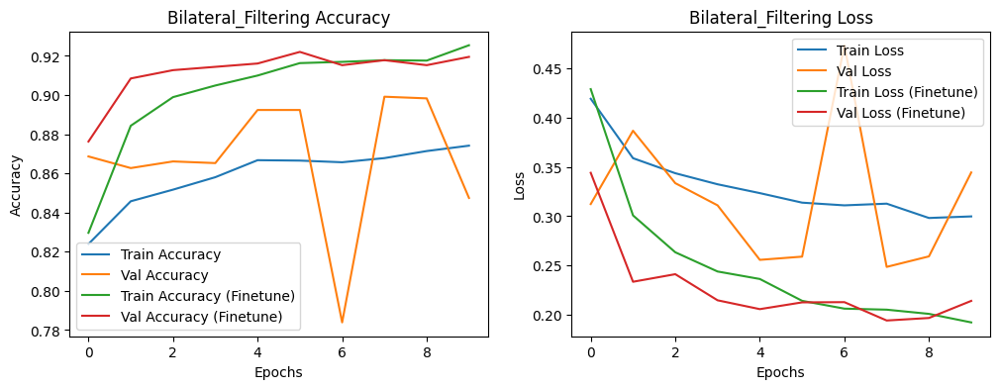

In [3]:
# Plot training & validation accuracy and loss
def plot_history(history, history_finetune, method):
        plt.figure(figsize=(12, 4))
        
        # Plot accuracy
        plt.subplot(1, 2, 1)
        plt.plot(history.history['accuracy'], label='Train Accuracy')
        plt.plot(history.history['val_accuracy'], label='Val Accuracy')
        plt.plot(history_finetune.history['accuracy'], label='Train Accuracy (Finetune)')
        plt.plot(history_finetune.history['val_accuracy'], label='Val Accuracy (Finetune)')
        plt.title(f'{method} Accuracy')
        plt.xlabel('Epochs')
        plt.ylabel('Accuracy')
        plt.legend()
        
        # Plot loss
        plt.subplot(1, 2, 2)
        plt.plot(history.history['loss'], label='Train Loss')
        plt.plot(history.history['val_loss'], label='Val Loss')
        plt.plot(history_finetune.history['loss'], label='Train Loss (Finetune)')
        plt.plot(history_finetune.history['val_loss'], label='Val Loss (Finetune)')
        plt.title(f'{method} Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        
        plt.show()

plot_history(history_resnet50, history_resnet50_finetune, method)